In [2]:
import os
from PIL import Image
import numpy as np
sourcePath = "lookbook/data"
import random
from matplotlib import pyplot as plt
os.path.isdir(sourcePath)
from sklearn.model_selection import train_test_split
#8726 unique products
import torch
import math
torch.__version__
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torch.autograd import Variable
import torch.utils.data
from torchvision import datasets,transforms
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
import time
from sklearn.manifold import TSNE
import pandas as pd
import matplotlib.pylab as pl
from sklearn.decomposition import PCA
torch.cuda.empty_cache()
import random
import pickle
path='/content/drive/My Drive/DLS Assignment/Assignment4'
from torchvision.transforms import Lambda,ToTensor
imgSize = 100
#learn.destroy() 
#gpu_mem_get_free_no_cache()

In [3]:
torch.cuda.is_available()

False

(224, 224, 3)


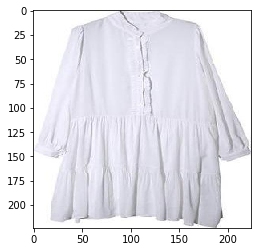

In [4]:
from google.cloud import storage
from zipfile import ZipFile
from zipfile import is_zipfile
import io

def zipextract(bucketname, zipfilename_with_path):

    storage_client = storage.Client()
    bucket = storage_client.get_bucket(bucketname)

    destination_blob_pathname = zipfilename_with_path

    blob = bucket.blob(destination_blob_pathname)
    zipbytes = io.BytesIO(blob.download_as_string())
    myzip = ZipFile(zipbytes)
    myfile = myzip.open('data/PID007964_CLEAN1_IID069038.jpg')
    data = np.array(Image.open(myfile).resize((224,224)))
    print(data.shape)
    plt.imshow(data)
    return(myzip)
    
img_ref = zipextract("dls-project", "data.zip")

In [5]:
prodIDName = {}
personIDName = {}
for filename in img_ref.namelist():
    ID = filename.split("_")[0]
    if "CLEAN1" in filename:
        if ID not in prodIDName:
            prodIDName[ID] = filename
        else:
            prodIDName[ID].append(filename)
    else:
        if ID not in personIDName:
            personIDName[ID] = [filename]
        else:
            personIDName[ID].append(filename)
        

In [6]:
print(len(set(personIDName)))
globalPos = 10
fewPosID = [each for each in prodIDName if len(personIDName[each])<globalPos]
print(len(fewPosID))

8726
6160


In [ ]:
#We use just this data since they have more than or equal to 10 positive samples
currData = list(set(prodIDName.keys())-set(fewPosID))
print(len(currData))

In [15]:
random.shuffle(currData)
testData =currData[0:566]
currData = currData[566:]
print(len(testData))
print(len(currData))

566
2000


In [8]:
# pickle.dump(currData,open("currData.pickle","wb"))
# pickle.dump(testData,open("testData.pickle","wb"))

In [7]:
# currData = pickle.load(open("currData.pickle","rb"))
# testData = pickle.load(open("testData.pickle","rb"))

In [8]:
# train and test do not overlap
print(set(testData).intersection(set(currData)))
print(set(currData).intersection(set(testData)))

set()
set()


In [9]:
print(prodIDName[currData[0]])
print(len(testData))
print(len(currData))

data/PID008210_CLEAN1_IID071306.jpg
566
2000


In [10]:
class Prepare():
  def __init__(self):
    pass
    
  def preparePairs(self,currId,prodData,personData,n_pairs):
    """Create pairs of images. 
    Args:
     currId: list of productIds to be used to make the train dataset
     prodData: dictionary where key is the product id, value is the image id of the product
     personData: dictionary where key is the product id, value is a list of image id of persons wearing the product
     n_pairs: number of positive and negative pairs to be formed
    Output:
     posPairs: list of tuples where each tuple is a positive pair
     negPairs: list of tuples where each tuple is a negative pair
    """
    posPairs = []
    negPairs = []
    # for each in currID for n_pairs with respective in personData and n_pairs with others in personData
    for eachId in currId:
        otherId = list(set(currId)-set([eachId]))
        random.shuffle(otherId)
        prodFilename = prodData[eachId]
        for i in range(0,n_pairs):
            posPairs.append((prodFilename,personData[eachId][i])) # positive sample
            negPairs.append((prodFilename,personData[otherId[i]][random.choice(list(range(0,globalPos)))])) # negative sample
    return(posPairs,negPairs)

  def prepareData(self,listTupleNames):
        """ transform each tuple of image names into a tuple of image vectors.
        Args:
         listTupleNames: list of tuples, where each tuple is a pair of imagefilenames
        Output:
        retResult: list of tuples, where each tuple is a pair of image vector representation
        """
        retResult = []
        for each in listTupleNames:
            retResult.append((np.array(Image.open(img_ref.open(each[0])).resize((imgSize,imgSize))),np.array(Image.open(img_ref.open(each[1])).resize((imgSize,imgSize)))))
        return(retResult)
            
prep = Prepare()

In [27]:
posNames,negNames= prep.preparePairs(currData,prodIDName,personIDName,10)

In [28]:
# Checks : below should not print any output
# checks if same product
for each in posNames:
    if each[0].split("_")[0]!=each[1].split("_")[0]:
        print(each)
for each in negNames:
    if each[0].split("_")[0]==each[1].split("_")[0]:
        print(each)
# checks if product is paired with person only
for each in negNames:
    if "CLEAN0" in each[0] or "CLEAN1" in each[1]:
        print(each)
for each in posNames:
    if "CLEAN0" in each[0] or "CLEAN1" in each[1]:
        print(each)

In [29]:
posData = prep.prepareData(posNames)
negData = prep.prepareData(negNames)

In [15]:
# pickle.dump(posData,open("posData.pickle","wb"))
# pickle.dump(negData,open("negData.pickle","wb"))

In [30]:
XTrain = np.append(posData,negData,axis = 0)
YTrain = np.append([1]*len(posData),[0]*len(negData),axis = 0)
print(XTrain.shape,YTrain.shape)

(40000, 2, 100, 100, 3) (40000,)


In [31]:
c = list(zip(XTrain,YTrain))
random.shuffle(c)
X_Train,Y_Train = zip(*c)

In [11]:

def train_model(model,optimizer,lossfunc,x_train,y_train,num_epochs=25,batch_size=128):
  since = time.time()
  best_wts=[]
  best_acc=0.0
  
  for epoch in range(num_epochs):
    print("For Epoch {}".format(epoch))
    loss_val=0.0;num_acc=0.0;
    
    for i in range(0,x_train.shape[0],batch_size):
      batch_X = x_train[i:i+batch_size]
      batch_Y = torch.FloatTensor(y_train[i:i+batch_size])
      data1 = torch.FloatTensor([each[0] for each in batch_X])
      data2 = torch.FloatTensor([each[1] for each in batch_X])
      input1, input2, labels = Variable(data1), Variable(data2), Variable(batch_Y)
        
      optimizer.zero_grad()
      model = model.train()
      model_output = model(input1,input2)
      loss = lossfunc(model_output, labels)
      loss.backward()
      optimizer.step()
      loss_val += loss.data.tolist()
      pred_y = model_output >= 0.5 # to obtain accuracy we use this to output 0's and 1's
      pred_y = pred_y.type(torch.FloatTensor)
      num_acc += torch.sum(pred_y == labels.data).tolist()
    trainAcc = num_acc/y_train.shape[0]
    print("Train loss {}".format(loss_val/x_train.shape[0]))
    print("Train Accuracy {}".format(trainAcc))
    if trainAcc>best_acc:
      best_acc = trainAcc
      best_wts = model.state_dict()
      
  print('Best val Acc: {:4f}'.format(best_acc))
  model.load_state_dict(best_wts)
  
  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
  return(model)


In [12]:
flatten_size = 5760
linear_hid = 2000
embedSize = 1000
inpLayers = 3
conv1OpLayers = 3
conv2OpLayers = 10
batchSize = 50
class Verify(nn.Module):
  def __init__(self):
    super(Verify,self).__init__()
    self.lenth = 0
    self.conv1 = nn.Conv2d(inpLayers, conv1OpLayers, kernel_size=3)
    torch.nn.init.kaiming_normal_(self.conv1.weight)
    self.relu1 = nn.LeakyReLU()
    self.max1 = nn.MaxPool2d(2)

    self.conv2 = nn.Conv2d(conv1OpLayers, conv2OpLayers, kernel_size=3)
    torch.nn.init.kaiming_normal_(self.conv2.weight)
    self.relu2 = nn.LeakyReLU()
    self.max2 = nn.MaxPool2d(4)
    self.b1 = nn.BatchNorm2d(10)
    self.drop = nn.Dropout2d(p=0.5)
    
    self.flat = nn.Flatten()
    self.Linear1 = nn.Linear(flatten_size, linear_hid)
    self.relu3 = nn.Tanh()
    self.Linear2 = nn.Linear(linear_hid, embedSize)
    self.sigm = nn.Sigmoid()
    
  def reshaping(self,data):
    shape = data.shape
    redata = data.reshape(shape[0],inpLayers,shape[1],shape[2])
    return(redata)
    
  def getLatentVector(self,data):

    x = self.conv1(data)

    x = self.relu1(x)
    
    x = self.max1(x)

    x = self.conv2(data)
    
    x = self.relu2(x)
    
    x = self.max2(x)

    x = self.b1(x)
   
    x = self.drop(x)
 
    x = self.flat(x)

    x = self.Linear1(x)
    
    x = self.relu3(x)
    
    x = self.Linear2(x)
    
    return(x)

  def forward(self,data1,data2):
    self.lenth = data1.shape[0]
    redata1 = self.reshaping(data1)
    redata2 = self.reshaping(data2)
    if torch.cuda.is_available():
      data1.cuda()
      data2.cuda()
    latVector1 = self.getLatentVector(redata1)
    latVector2 = self.getLatentVector(redata2)
    pred_op = F.cosine_similarity(latVector1,latVector2)
    return(self.sigm(pred_op))


In [20]:
learning_rate = 0.05
print("learning_rate",learning_rate)
model = Verify()
print(model) 
criterion = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate,momentum=0.9)
ret_model = train_model(model,optimizer,criterion,np.array(X_Train),np.array(Y_Train),num_epochs=15,batch_size=batchSize)

learning_rate 0.05
Verify(
  (conv1): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1))
  (relu1): LeakyReLU(negative_slope=0.01)
  (max1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
  (relu2): LeakyReLU(negative_slope=0.01)
  (max2): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (b1): BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (drop): Dropout2d(p=0.5, inplace=False)
  (flat): Flatten()
  (Linear1): Linear(in_features=5760, out_features=2000, bias=True)
  (relu3): Tanh()
  (Linear2): Linear(in_features=2000, out_features=1000, bias=True)
  (sigm): Sigmoid()
)
For Epoch 0
Train loss 0.012208353812992572
Train Accuracy 0.68525
For Epoch 1
Train loss 0.012015925113111734
Train Accuracy 0.697025
For Epoch 2
Train loss 0.011924390987306834
Train Accuracy 0.703125
For Epoch 3
Train loss 0.011852460847049951
Train Accuracy 0.708525
For

In [22]:
# pickle.dump(ret_model,open("ret_model.pickle","wb"))

In [13]:
# ret_model = pickle.load(open("old_Dec16_ret_model.pickle","rb"))

# Experiment 1

In [98]:
posNamesTest,negNamesTest= prep.preparePairs(testData,prodIDName,personIDName,10)
print(len(posNamesTest),len(negNamesTest))
posDataTest = prep.prepareData(posNamesTest)
negDataTest = prep.prepareData(negNamesTest)
print(np.array(posDataTest).shape,np.array(negDataTest).shape)
X_Test = np.append(posDataTest,negDataTest,axis = 0)
Y_Test = np.append([1]*len(posDataTest),[0]*len(negDataTest),axis = 0)
print(X_Test.shape,Y_Test.shape)
py_X_test=np.array(list(X_Test))
py_Y_test=np.array(list(Y_Test))

5660 5660
(5660, 2, 100, 100, 3) (5660, 2, 100, 100, 3)
(11320, 2, 100, 100, 3) (11320,)


In [14]:
def generateOutput(x_test,y_test,batch_size=200):
  """Given the test input returns the output scores and output prediction(0 or 1)
  """
  num_acc=0.0;
  final_pred_y = []
  final_model_output = []
  for i in range(0,y_test.shape[0],batch_size):
      batch_X = x_test[i:i+batch_size]
      batch_Y = torch.FloatTensor(y_test[i:i+batch_size])
      data1 = torch.FloatTensor([each[0] for each in batch_X])
      data2 = torch.FloatTensor([each[1] for each in batch_X])
      input1, input2, labels = Variable(data1), Variable(data2), Variable(batch_Y)
      ret_model.eval()
      model_output = ret_model(input1,input2)
      pred_y = model_output >= 0.5
      pred_y = pred_y.type(torch.FloatTensor)
      num_acc += torch.sum(pred_y == labels.data).tolist()
      final_pred_y += pred_y.tolist()
      final_model_output += model_output.tolist()
  Accuracy = num_acc/y_test.shape[0] 
  print("Accuracy: ",Accuracy)
  return(final_model_output,final_pred_y)

In [100]:
print("Test accuracy")
_,predTest = generateOutput(py_X_test,py_Y_test,batchSize)

Test accuracy
Accuracy:  0.7131625441696113


In [101]:
from sklearn.metrics import *
def evaluate(ytrain,ytest,ypred_train,ypred_test):
        """show the evaluation results for the train and test set.
        """
        metric=pd.DataFrame([[0]*4]*2,columns=['PRECISION','RECALL','F1_SCORE','ACCURACY'],index=['Train','Test'],dtype='float32')
        metric['PRECISION']['Train']=precision_score(ytrain, ypred_train)
        metric['RECALL']['Train']=recall_score(ytrain, ypred_train)
        metric['F1_SCORE']['Train']=f1_score(ytrain, ypred_train)
        metric['ACCURACY']['Train']=accuracy_score(ytrain,ypred_train)
        metric['PRECISION']['Test']=precision_score(ytest, ypred_test)
        metric['RECALL']['Test']=recall_score(ytest, ypred_test)
        metric['F1_SCORE']['Test']=f1_score(ytest, ypred_test)
        metric['ACCURACY']['Test']=accuracy_score(ytest,ypred_test)
        print(metric)
        print("Train confusion matrix")
        print(confusion_matrix(ytrain,ypred_train))
        print("Test confusion matrix")
        print(confusion_matrix(ytest,ypred_test))
        

In [102]:
_,predTrain = generateOutput(np.array(X_Train),np.array(Y_Train),batchSize)

Accuracy:  0.73805


In [103]:
evaluate(np.array(Y_Train),py_Y_test,predTrain,predTest)

       PRECISION    RECALL  F1_SCORE  ACCURACY
Train   0.663631  0.965450  0.786581  0.738050
Test    0.652741  0.910954  0.760528  0.713163
Train confusion matrix
[[10213  9787]
 [  691 19309]]
Test confusion matrix
[[2917 2743]
 [ 504 5156]]


In [104]:
predTest = np.array(predTest)
similar = np.where(np.array(predTest)==1.0)[0]
dissimilar = np.where(np.array(predTest)==0.0)[0]
print(len(similar),len(dissimilar))

7899 3421


## Predictions by model as similar
 i.e. the person is wearing the same product with which they are paired

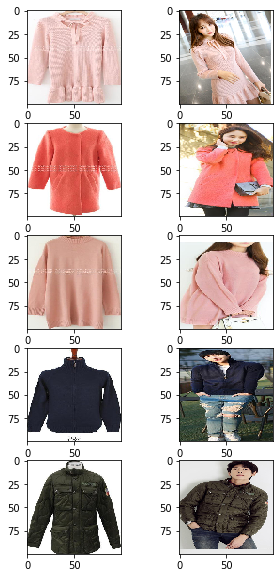

In [105]:
c = 1
random.shuffle(similar)
columns = 2
rows = 5
fig=plt.figure(figsize=(5, 10))
for ind in similar:
    img0 = py_X_test[ind][0]
    img1 = py_X_test[ind][1]
    fig.add_subplot(rows, columns, c)
    plt.imshow(img0)
    fig.add_subplot(rows, columns, c+1)
    plt.imshow(img1)
    c+=2
    if c>10:
        break;
    
plt.show()

## Predictions by model as dissimilar
i.e. the person is wearing a different clothing product than the one they are paired with

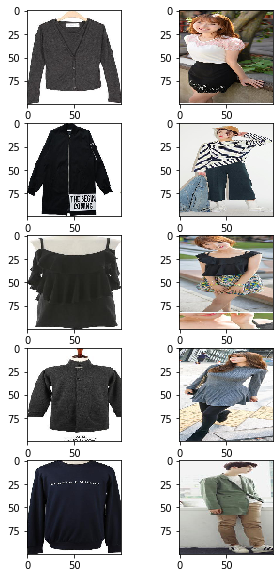

In [106]:
c = 1
random.shuffle(dissimilar)
columns = 2
rows = 5
fig=plt.figure(figsize=(5, 10))
for ind in dissimilar:
    img0 = py_X_test[ind][0]
    img1 = py_X_test[ind][1]
    fig.add_subplot(rows, columns, c)
    plt.imshow(img0)
    fig.add_subplot(rows, columns, c+1)
    plt.imshow(img1)
    c+=2
    if c>10:
        break;
    
plt.show()

# Experiment 2

In [15]:
def prepareTestPairs(testData,prodIDName,personIDName):
    pairs = []
    ylabel = []
    for idProd in testData:
        otherIDs = list(set(testData)-set([idProd]))
        product = prodIDName[idProd]
        eachperson = personIDName[idProd][0]
        pairs.append((product,eachperson))
        ylabel.append(1)
        for eachOther in otherIDs:
            pairs.append((prodIDName[eachOther],eachperson))
            ylabel.append(0)
    return(pairs,ylabel)

def pairedImageNames(testXPairs):
    dict_paired_products = {}
    for i in range(0,len(testXPairs)):
        eachPair = testXPairs[i]
        person = eachPair[1]
        product = eachPair[0]
        if person not in dict_paired_products:
            dict_paired_products[person] = [product]
        else:
            dict_paired_products[person].append(product)
    return(dict_paired_products)

In [16]:
def getScore(scores,topNum,samplesize):
    """
    dict_predictions here has the topNum recommended products for a person
    """
    dict_predictions = {}
    accuracy = 0
    total = 0
    set0Cond = 0
    if topNum == 0:
        topNum = 5
        set0Cond = 1
    for i in range(0,len(scores),samplesize):
        eachScores = scores[i:i+samplesize]
        topIndex = np.argsort(eachScores)[::-1]
        top5 = topIndex[0:topNum]
        if  (set0Cond and top5[0]==0) or (not set0Cond and 0 in top5):
            accuracy+=1
            dict_predictions[testXPairs[i][1]] = [dict_paired_products[testXPairs[i][1]][j] for j in top5] 
        total+=1
    return(accuracy,total,dict_predictions)

In [17]:
def display_images(predicts,topNum,accuracy, size = (50, 100),limit = 5):
    if topNum ==0:
        topNum = 5
    columns = topNum+1
    rows = accuracy
    fig=plt.figure(figsize=size)
    c=1
    current_row=0
    for person in predicts:
        img0 = np.array(Image.open(img_ref.open(person)).resize((250,250)))
        fig.add_subplot(rows, columns, c)
        plt.imshow(img0)
        c+=1
        for product in predicts[person]:
            img1 = np.array(Image.open(img_ref.open(product)).resize((250,250)))
            fig.add_subplot(rows, columns, c)
            c+=1
            plt.imshow(img1)
        current_row+=1
        if current_row>=limit:
            break
    plt.show()

# Number of Products: 50

In [108]:
samplesize = 50        
testXPairs,testYlabels = prepareTestPairs(testData[0:samplesize],prodIDName,personIDName)
dict_paired_products = pairedImageNames(testXPairs)
print(len(testXPairs))
print(len(set(testXPairs)))

2500
2500


In [109]:
testXInput = prep.prepareData(testXPairs)
testXInput = np.array(testXInput)
testYlabels = np.array(testYlabels)
print(testXInput.shape,testYlabels.shape)

(2500, 2, 100, 100, 3) (2500,)


In [110]:
predScore,predTest = generateOutput(testXInput,testYlabels,batchSize)

Accuracy:  0.5448


## Top 1
Here the right product in position 1 of the top 5 recommendations

number of correct test images 3
total number of test images 50
Accuracy 0.06


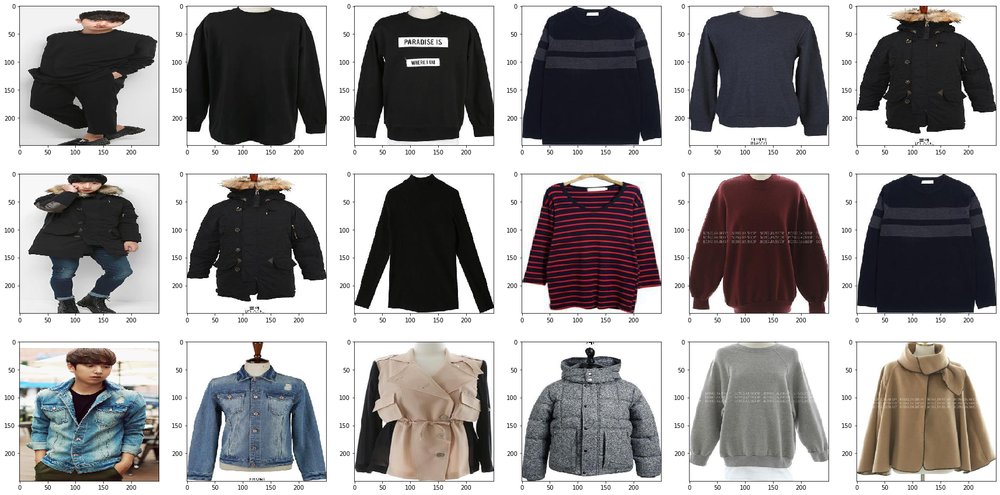

In [189]:
topNum = 0
samplesize = 50
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy,(30,15))

## Top 5 recommended products
Here the right product is in top 5 recommendations

number of correct test images 18
total number of test images 50
Accuracy 0.36


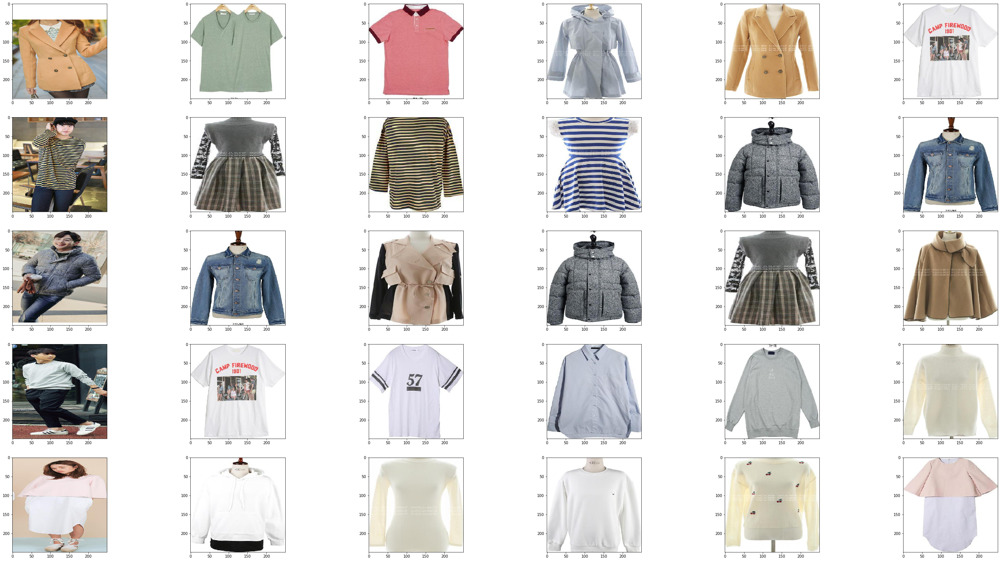

In [190]:
topNum = 5
samplesize = 50
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy)

## Top 10 recommended products
Here the right product is in top 10 recommendations

number of correct test images 28
total number of test images 50
Accuracy 0.56


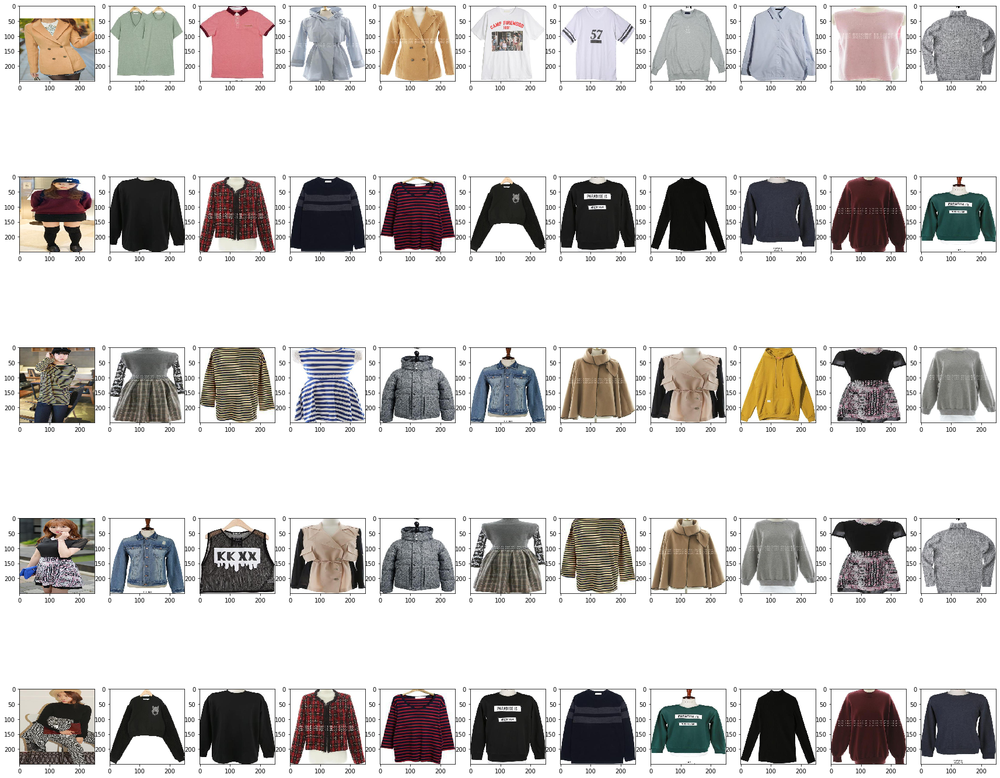

In [191]:
topNum = 10
samplesize = 50
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy,(30,150))

## Top 20 recommended products
Here the right product is in top 20 recommendations

number of correct test images 43
total number of test images 50
Accuracy 0.86


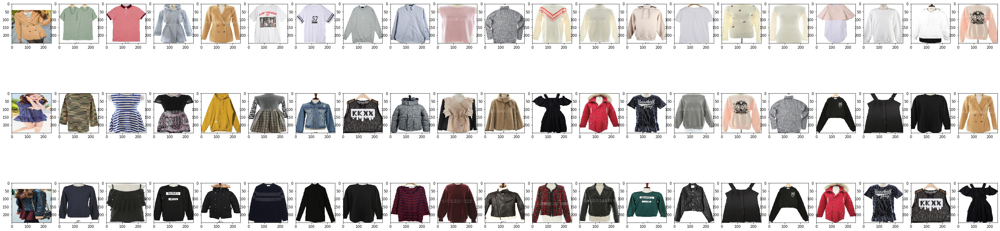

In [195]:
topNum = 20
samplesize = 50
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy,(50,200),limit=3)

# Number of Products: 300

In [20]:
samplesize = 300        
testXPairs,testYlabels = prepareTestPairs(testData[0:samplesize],prodIDName,personIDName)
dict_paired_products = pairedImageNames(testXPairs)
print(len(testXPairs))
print(len(set(testXPairs)))

90000
90000


In [16]:
testXInput = prep.prepareData(testXPairs)
testXInput = np.array(testXInput)
testYlabels = np.array(testYlabels)
print(testXInput.shape,testYlabels.shape)

(90000, 2, 100, 100, 3) (90000,)


In [20]:
predScore,predTest = generateOutput(testXInput,testYlabels,batchSize)

Accuracy:  0.5235777777777778


In [18]:
# pickle.dump(predScore,open("predScore300.pickle","wb"))
predScore = pickle.load(open("latestPredScore300.pickle","rb"))

## Top1

number of correct test images 1
total number of test images 300
Accuracy 0.0033333333333333335


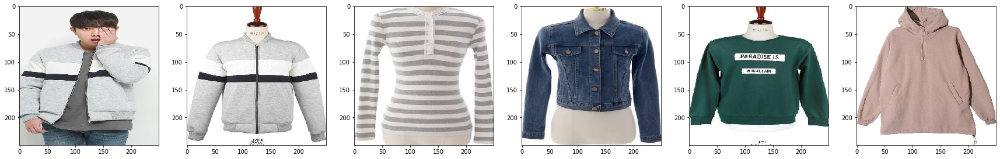

In [21]:
topNum = 0
samplesize = 300
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy,(30,15))

## Top5

number of correct test images 13
total number of test images 300
Accuracy 0.043333333333333335


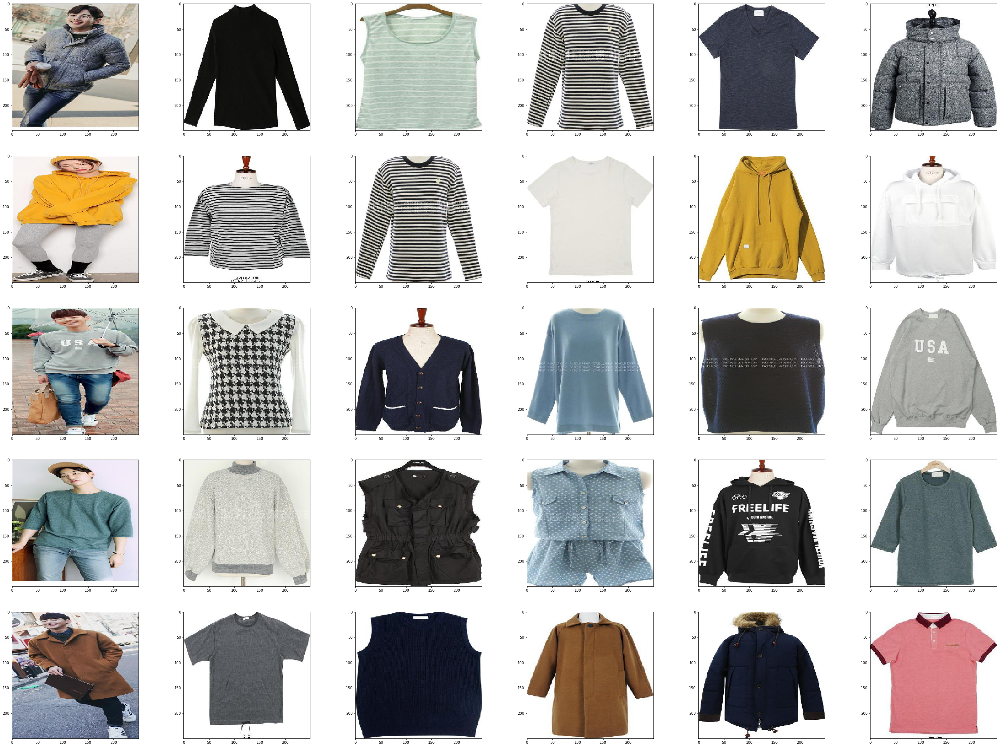

In [22]:
topNum = 5
samplesize = 300
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy)

## Top10

number of correct test images 32
total number of test images 300
Accuracy 0.10666666666666667


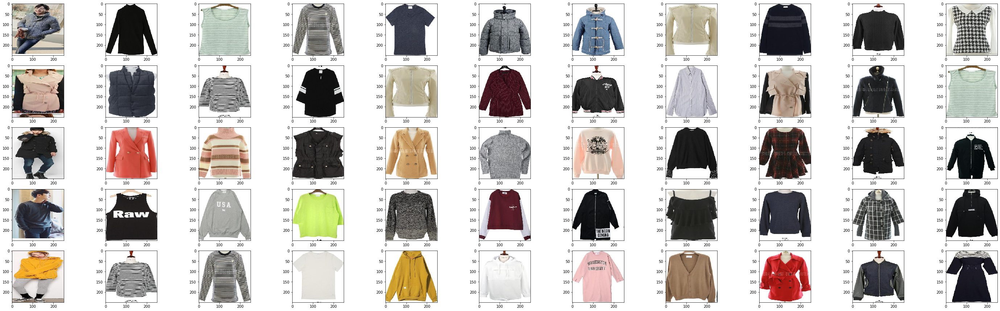

In [23]:
topNum = 10
samplesize = 300
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy)

## Top20

number of correct test images 60
total number of test images 300
Accuracy 0.2


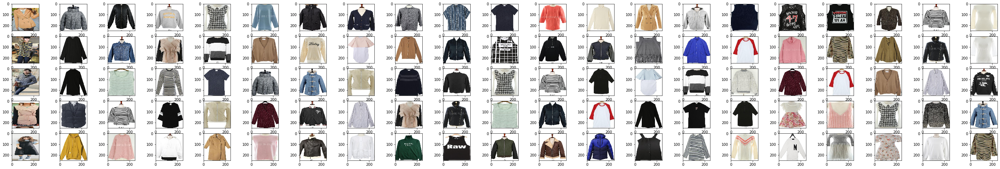

In [24]:
topNum = 20
samplesize = 300
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
display_images(predicts,topNum,accuracy)

# Top 54

In [25]:
topNum = 54
samplesize = 300
accuracy,total,predicts = getScore(predScore,topNum,samplesize)
print("number of correct test images",accuracy)
print("total number of test images",total)
print("Accuracy",accuracy/total)
# display_images(predicts,topNum,accuracy,(50,200),limit=3)

number of correct test images 146
total number of test images 300
Accuracy 0.4866666666666667
